# End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.10.1 and TensorFlow Hub

## Problem

Identifying the breed of a dog given an image of a dog

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is

## Data

The data we're using is from Kaggle's dog breed identification competition

https://www.kaggle.com/c/dog-breed-identifcation/data

## Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image

https://www.kaggle.com/c/dog-breed-identifcation/overview/evaluation

## Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes)
* There are around 10,000+ images in the training set (these images have labels)
* There are around 10,000 images in the test set (these images have no labels)

### Get our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [1]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print('TF version:', tf.__version__)
print('TF Hub Version:', hub.__version__)

# Check for GPU availability
print('GPU', 'available' if tf.config.list_physical_devices('GPU') else 'not available')

TF version: 2.10.1
TF Hub Version: 0.15.0
GPU not available


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representation)

Let's start by accessing our data and checking out the labels

In [115]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv('labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [116]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

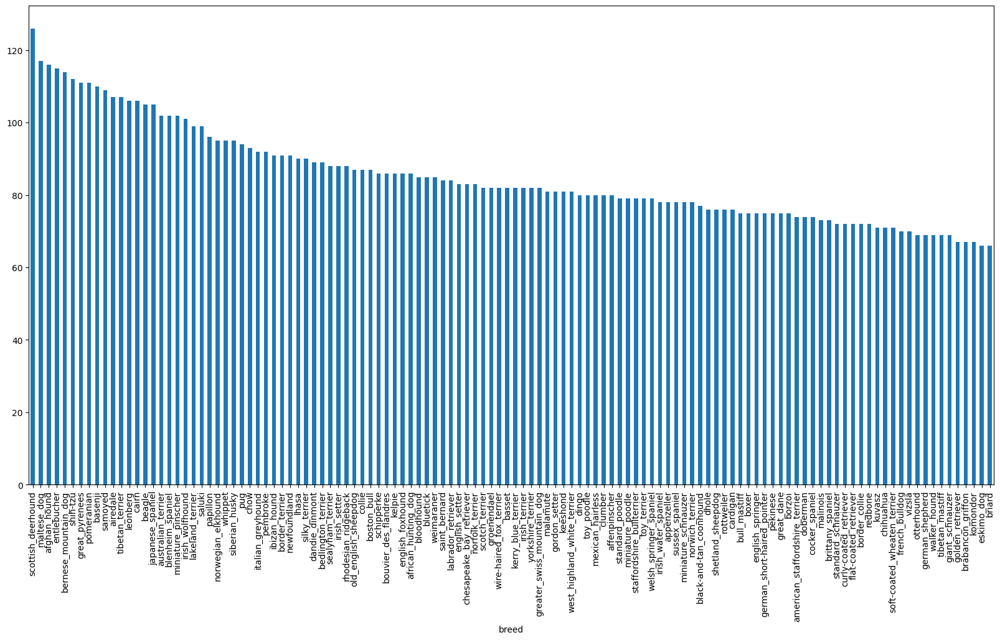

In [117]:
 # How many images are there of each breed
labels_csv['breed'].value_counts().plot.bar(figsize =(20,10))

In [118]:
labels_csv['breed'].value_counts().median()

82.0

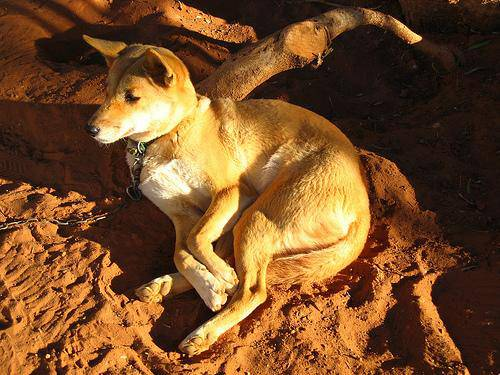

In [119]:
# Viewing an image
from IPython.display import Image
Image("train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Get a list of all image file pathnames

In [120]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [121]:
# Create path names from image ID's
filename = ['train/' + fname + '.jpg' for fname in labels_csv['id']]

filename[:10]

['train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'train/001cdf01b096e06d78e9e5112d419397.jpg',
 'train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'train/002a283a315af96eaea0e28e7163b21b.jpg',
 'train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [122]:
# Check whether number of filenames matches number of actual image files
import os
os.listdir('train/')[:10]
if len(os.listdir('train/')) == len(filename):
  print('File names match actual amount of files. Proceed')

else:
  print('File names does not match actual amount of files')

File names match actual amount of files. Proceed


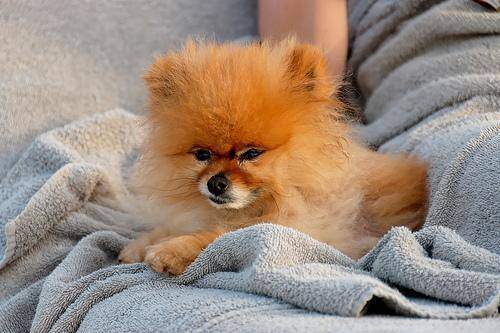

In [123]:
Image(filename[8000])

In [124]:
labels_csv['breed'][8000]

'pomeranian'

We now have our training image filepaths in a list. Time to prepare the labels

In [125]:
labels = labels_csv['breed']
labels

0                     boston_bull
1                           dingo
2                        pekinese
3                        bluetick
4                golden_retriever
                   ...           
10217                      borzoi
10218              dandie_dinmont
10219                    airedale
10220          miniature_pinscher
10221    chesapeake_bay_retriever
Name: breed, Length: 10222, dtype: object

In [126]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
#labels = np.array(labels) Does same as above
len(labels)

10222

In [127]:
# See if number of labels matches the number of filenames
if len(labels) == len(filename):
  print('Number of labels match number of filenames')

else:
  print('Number of labels does not match the number of filenames')

Number of labels match number of filenames


In [128]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [129]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [130]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [131]:
len(boolean_labels)

10222

In [132]:
# Example: Turning boolean array into integers
print(labels[0]) # Original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) #There will be a 1 where the sample label occurs

boston_bull
(array([19], dtype=int64),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [133]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [134]:
filename[:10]

['train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'train/001cdf01b096e06d78e9e5112d419397.jpg',
 'train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'train/002a283a315af96eaea0e28e7163b21b.jpg',
 'train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own

In [135]:
# Setup X & Y variables
X = filename
y = boolean_labels
len(filename)

10222

We're going to start off experimenting with ~1000 images and increase as needed

In [136]:
# Set number of images to use for experimenting

In [137]:
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max:10000, step:1000}

In [138]:
# Let's split our data into train and validation
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [139]:
 # Looking at training data
X_train[:5], y_train[:2]

(['train/00bee065dcec471f26394855c5c2f3de.jpg',
  'train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, Fa

## Preprocessing Images (turning images into Tensors)

To preprocess our image into Tensors we're going to write a function that does a few things:
* Take an image filepath as input
* Use TensorFlow to read the file and save it to a variable, `image`
* Turn our `image` (a jpg) into Tensors
* Resize the `image` to be a shape of (224,224)
* Return the modified `image`

Before we do, let's see what importing an image looks like

In [140]:
# Convert an image to NumPy
from matplotlib.pyplot import imread
image = imread(filename[42])
image.shape

(257, 350, 3)

In [141]:
image

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [142]:
# Turn an image into a Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them
* Take an image filepath as input
* Use TensorFlow to read the file and save it to a variable, `image`
* Turn our `image` (a jpg) into Tensors
* Normalize our image (convert color channel values from 0-255 to 0-1)
* Resize the `image` to be a shape of (224,224)
* Return the modified `image`

In [143]:
# Define image size
img_size = 224

# Create a function for preprocessing images
def process_image(image_path, IMG_SIZE = img_size):
  """
  Take an image file path and turns the image into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels = 3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ imagesin one go, they might not all fit into memory

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust batch size if need be)

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image,label)`


In [144]:
# Create a simple function to return a tuple (image. label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image,label)
  """
  image = process_image(image_path)
  return image, label

In [145]:
# Demo of the above
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (`X` and `y`) into batches

In [146]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image (X) and label(y) pairs.
  Shuffles the data if it's training data, but doesn't shuffle if it's validation data
  Also accepts test data as input (no labels).
  """
  # If the data is a test data set, we probably don't have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # Only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it

  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                              tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print('Creating training data batches...')
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size = len(X))
    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training daata into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [147]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

Creating training data batches...
Creating validation data batches...


In [148]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize  them

In [149]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize = (10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i + 1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [150]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [151]:
train_images, train_labels = next(train_data.as_numpy_iterator())

In [152]:
len(train_images), len(train_labels)

(32, 32)

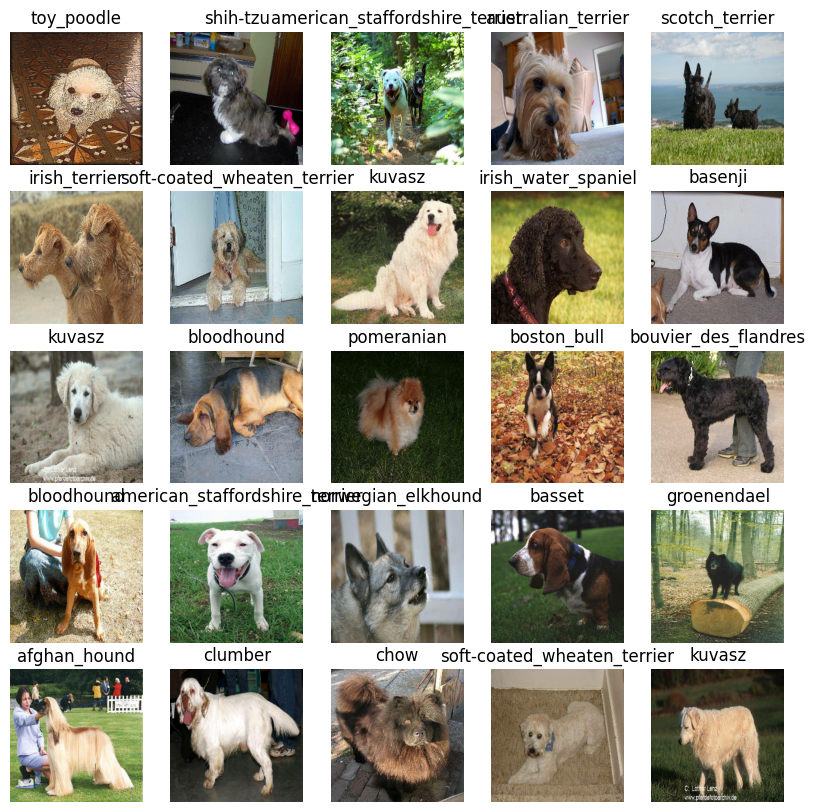

In [153]:
# Visualizing the data in a training batch
show_25_images(train_images, train_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use

In [154]:
# Setup input shape to the model
INPUT_SHAPE = [None, img_size, img_size, 3] # batch, height, width, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4'

Now that we have our inputs, outputs, and model
Let's put them together into a Keras deep learning model

Knowing this, let's create a function which:
* Takes the input shape, output shape, and model as parameters.
* Defines the layers in a Keras model in sequential fashion (do this, then this, then that)
* Compile the model (says it should be evaluated and improved)
* Builds the model (tells the model the input shape it'll be getting)
* Returns the model

All of these steps can be found here https://www.tensorflow.org/guide/keras/overview


In [155]:
# Create a function which builds a Keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
    print('Building model with:',MODEL_URL)

    # Setup the model layers
    model = tf.keras.Sequential([
          hub.KerasLayer(MODEL_URL), # Layer 1 (input shape)
          tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                                activation = 'softmax') # Layer 2 (output layer)


    ])

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(), # Lower loss = better predictions
        optimizer = tf.keras.optimizers.Adam(), # Optimizers lower the loss function
        metrics = ['accuracy'] # Shows how well the model's predictions are
    )
    # Build the model
    model.build(INPUT_SHAPE)

    return model



In [156]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_4 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_4 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress, or stop training early if a model stops improving

We'll create two callbacks, one for TensorBoard which helps track of our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback
To setup a TensorBoard callback, we need to do 3 things:
* Load the TensorBoard notebook extension
* Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
* Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training)


In [157]:
# Load TensorBoard notebook extension
%load_ext tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [158]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join('logs/',
                        # Make it so the logs get tracked whenever we run the experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [159]:
# Create a early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                  patience = 3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working

In [160]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10, max:100, step:10}

In [161]:
# Check to make sure we're still running on a GPU
print('GPU', 'available' if tf.config.list_physical_devices('GPU') else 'not available')


GPU not available


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`), and the callbacks we want to use
* Return the model


In [162]:
# Build a funcion to train and return a trained model
def train_model():
  '''
  Trains a given model and returns the trained version.
  '''
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])

  # Return the fitted model
  return model

In [163]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 12s 414ms/step - loss: 4.6804 - accuracy: 0.0850 - val_loss: 3.5288 - val_accuracy: 0.2300
Epoch 2/100
25/25 [==============================] - 10s 396ms/step - loss: 1.6567 - accuracy: 0.7013 - val_loss: 2.2196 - val_accuracy: 0.4700
Epoch 3/100
25/25 [==============================] - 9s 376ms/step - loss: 0.5714 - accuracy: 0.9312 - val_loss: 1.7339 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 10s 396ms/step - loss: 0.2541 - accuracy: 0.9837 - val_loss: 1.5150 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 9s 372ms/step - loss: 0.1490 - accuracy: 0.9975 - val_loss: 1.4377 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 10s 392ms/step - loss: 0.1005 - accuracy: 0.9975 - val_loss: 1.3837 - val_accuracy: 0.6750
Epoch 7/100
25/25 [==========================

**Question:** It looks like  our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks

**Answer:** This can be solved by either adding more data for the neural network to learn from or by adding more complex data that has less patterns than what is currently being used

**Note:** Overfitting to begin with is a good thing. It means our model is learning

### Checking the TensorBoard logs

The TensorBoard magic funtion (`%tensorboard`) wil access the logs directory we created earlier and visualize its contents

In [164]:
%tensorboard --logdir /content/logs

Reusing TensorBoard on port 6006 (pid 20648), started 0:56:05 ago. (Use '!kill 20648' to kill it.)

## Making and evaluating predictions using a trained model

In [165]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [166]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 256ms/step


array([[4.7365692e-03, 2.5953415e-05, 5.7430292e-04, ..., 3.6475979e-04,
        1.2467885e-04, 2.6050424e-03],
       [1.3512677e-03, 7.8846677e-04, 4.8699318e-03, ..., 8.7005063e-04,
        4.0206182e-04, 8.7404333e-05],
       [9.5419935e-05, 6.7129044e-04, 1.1986904e-04, ..., 5.7890825e-04,
        2.2278189e-04, 1.5347517e-03],
       ...,
       [7.2141611e-06, 1.1099280e-04, 4.1958792e-05, ..., 6.9189600e-06,
        4.0129430e-04, 2.0883241e-04],
       [1.6871549e-03, 5.7489091e-05, 2.6268189e-04, ..., 1.6794918e-04,
        4.4295855e-05, 3.5882366e-03],
       [1.3977360e-03, 3.1819542e-05, 9.5217780e-04, ..., 3.7502008e-03,
        1.3109187e-03, 7.9616817e-05]], dtype=float32)

In [167]:
predictions[0]

array([4.73656924e-03, 2.59534154e-05, 5.74302918e-04, 6.69941946e-04,
       3.47706693e-04, 1.91472092e-04, 7.04942597e-03, 3.94819712e-04,
       5.87380433e-04, 1.47168478e-03, 1.39003049e-03, 3.33930715e-04,
       8.65132897e-04, 6.97479263e-05, 1.69858430e-03, 2.59829126e-03,
       1.46015329e-04, 4.48220223e-01, 1.34335132e-04, 1.22147292e-04,
       2.42528971e-03, 7.85966695e-04, 5.54621947e-05, 9.49092500e-04,
       9.13819094e-05, 1.40188495e-03, 9.35004726e-02, 1.84593257e-04,
       2.10047141e-03, 6.17747137e-04, 8.81445478e-04, 1.60841050e-03,
       2.04605144e-03, 2.80738837e-04, 8.54106693e-05, 1.44923404e-02,
       9.59598619e-05, 1.01819904e-04, 2.09858001e-04, 1.96204608e-04,
       1.85052783e-03, 4.58783798e-05, 9.18673031e-05, 1.31425884e-04,
       8.32988881e-05, 4.84014308e-05, 1.64979701e-05, 1.46037477e-04,
       4.53103799e-04, 8.80192674e-04, 7.13773130e-04, 1.36735616e-04,
       5.87844173e-04, 6.14914316e-05, 1.72411266e-04, 1.25036662e-04,
      

In [168]:
np.sum(predictions[0])

1.0

In [169]:
# First prediction
index = 2
print(predictions[index])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[9.54199350e-05 6.71290443e-04 1.19869037e-04 7.27909719e-05
 2.78120791e-03 8.77370403e-05 1.05899584e-03 2.03320459e-02
 5.53895533e-01 3.26271467e-02 2.56573985e-05 2.12645251e-03
 9.21833387e-04 1.02061788e-02 2.08823737e-02 2.63673777e-04
 4.96182358e-04 5.09456040e-05 3.48000467e-05 4.74248838e-04
 1.24592378e-04 1.35891803e-03 5.26209944e-04 1.59509800e-04
 7.03086238e-03 5.34529427e-05 5.12496808e-05 6.87331849e-05
 3.73403745e-05 5.27742784e-04 7.75088938e-06 4.82381234e-04
 5.64162806e-03 6.66492488e-05 1.07427375e-04 6.46860208e-05
 2.39295623e-04 9.49221139e-05 2.42508977e-05 7.21299322e-03
 1.34558545e-03 4.18781827e-04 9.95768001e-04 7.43592027e-05
 2.71322235e-04 4.51424894e-05 7.48305756e-05 1.21913909e-04
 1.40515695e-04 3.42119043e-03 1.52331870e-03 7.14927912e-04
 2.83617846e-04 8.57135310e-05 1.79455458e-06 1.91931715e-04
 6.25097775e-04 5.05202508e-04 3.63036706e-05 1.43894984e-04
 1.02183921e-03 4.21410405e-05 8.91893160e-06 8.29854525e-06
 5.55525367e-05 5.727601

In [170]:
unique_breeds[8]

'basset'

Having the above functionality is great but we want to be able to do it at scale

And it would be even better if we could see the image the prediction is being made on

**Note:** Prediction probabilities are also known as confidence levels

In [171]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label


'border_terrier'

Now since our validation data is still in a batch dataset, we'll have to unbatch it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels)

In [172]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [173]:
# Create a function to unbatch a batch dataset

def unbatchify(batch_data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate array of images and labels
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image_current, label_current in batch_data.unbatch().as_numpy_iterator():
    images.append(image_current)
    labels.append(unique_breeds[np.argmax(label_current)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visual

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels, and an array of images and integers
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label, and the target image on a single plot

In [174]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth, and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove tick marks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change  plot title to be predicted, probability of prediction, and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob) * 100,
                                    true_label),
                                    color = color)


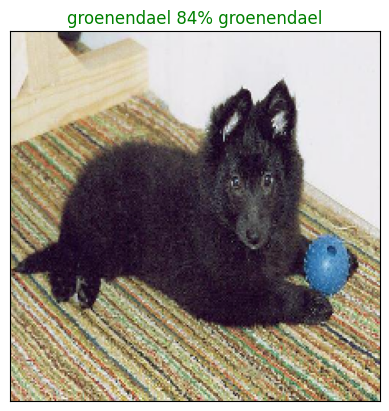

In [175]:
plot_pred(prediction_probabilities = predictions,
          labels = val_labels,
          images = val_images,
          n=77)

Now we've got one function to visualize our model's top prediction, let's make another to view our model's top 10 predictions

This function will:
* Take an input of prediction probabilities array, a ground truth array, and an integer
* Find the prediction using `get_pred_label`
* Find  the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability valies and labels, coloring the true label green

In [176]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = 'grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = 'vertical')

  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')

  else:
    pass

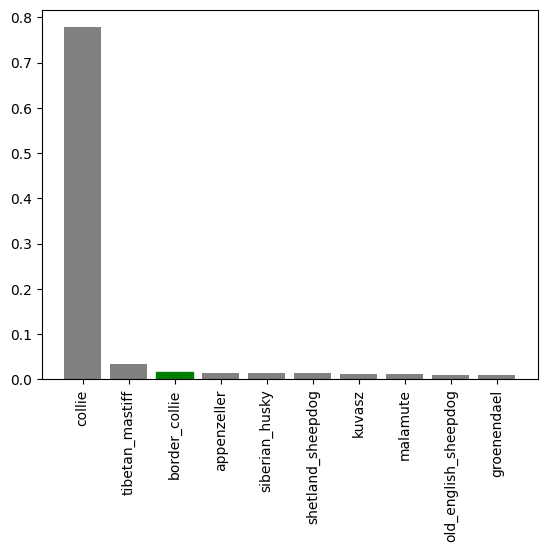

In [177]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

In [178]:
predictions[0]

array([4.73656924e-03, 2.59534154e-05, 5.74302918e-04, 6.69941946e-04,
       3.47706693e-04, 1.91472092e-04, 7.04942597e-03, 3.94819712e-04,
       5.87380433e-04, 1.47168478e-03, 1.39003049e-03, 3.33930715e-04,
       8.65132897e-04, 6.97479263e-05, 1.69858430e-03, 2.59829126e-03,
       1.46015329e-04, 4.48220223e-01, 1.34335132e-04, 1.22147292e-04,
       2.42528971e-03, 7.85966695e-04, 5.54621947e-05, 9.49092500e-04,
       9.13819094e-05, 1.40188495e-03, 9.35004726e-02, 1.84593257e-04,
       2.10047141e-03, 6.17747137e-04, 8.81445478e-04, 1.60841050e-03,
       2.04605144e-03, 2.80738837e-04, 8.54106693e-05, 1.44923404e-02,
       9.59598619e-05, 1.01819904e-04, 2.09858001e-04, 1.96204608e-04,
       1.85052783e-03, 4.58783798e-05, 9.18673031e-05, 1.31425884e-04,
       8.32988881e-05, 4.84014308e-05, 1.64979701e-05, 1.46037477e-04,
       4.53103799e-04, 8.80192674e-04, 7.13773130e-04, 1.36735616e-04,
       5.87844173e-04, 6.14914316e-05, 1.72411266e-04, 1.25036662e-04,
      

In [179]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.44822022, 0.09350047, 0.04745332, 0.03072307, 0.02789676,
       0.02652476, 0.02515867, 0.0251521 , 0.02495396, 0.02408978],
      dtype=float32)

In [180]:
predictions[0].max()

0.44822022